In [22]:
%load_ext autoreload
%autoreload 2

import os
from jax import config
config.update("jax_enable_x64", True)

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" 
os.environ["CUDA_VISIBLE_DEVICES"] = ''
from encoding_information.gpu_utils import limit_gpu_memory_growth
limit_gpu_memory_growth()

from encoding_information.datasets import BSCCMDataset, MNISTDataset
import jax.numpy as np

from cleanplots import *
from tqdm import tqdm

def apply_gaussian_blur(image, sigma):
    """
    Blur an image using a Gaussian filter.
    
    Args:
        image: Input image (H, W) or (H, W, C)
        sigma: Standard deviation of the Gaussian kernel
    
    Returns:
        Blurred image with same shape as input
    """
    if sigma == 0:
        return image
    
    # Handle grayscale and color images
    if len(image.shape) == 2:
        # Grayscale image
        return gaussian_filter(image, sigma=sigma)
    else:
        # Color image - apply filter to each channel
        blurred = np.zeros_like(image)
        for i in range(image.shape[2]):
            blurred[:, :, i] = gaussian_filter(image[:, :, i], sigma=sigma)
        return blurred


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Process hi res images

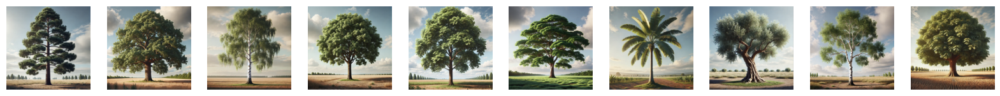

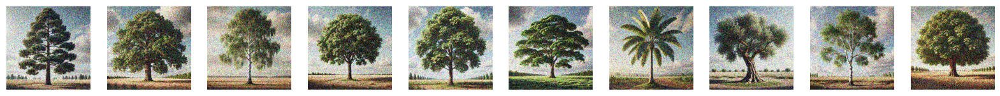

In [2]:
shape = (220, 220)
sigma = 50

# load all png files in '/home/hpinkard_waller/data/trees/high_res' into numpy arrays
from PIL import Image
import os
import numpy as np

path = '/home/hpinkard_waller/data/trees/high_res/'
images = []
for name in os.listdir(path):
    img = Image.open(path + name)
    img = np.array(img)
    images.append(img)

# crop to largest square centered in the image
for i, img in enumerate(images):
    h, w = img.shape[:2]
    if h > w:
        diff = h - w
        img = img[:, diff//2:diff//2 + w]
    elif w > h:
        diff = w - h
        img = img[diff//2:diff//2 + h, :]
    images[i] = img

# resize to 128 x 128 numpy arrays
images = np.array([np.array(Image.fromarray(img).resize(shape)) for img in images])

# plot some
from cleanplots import *
fig, axs = plt.subplots(1, 10, figsize=(20, 2))
for ax, img in zip(axs, images):
    ax.imshow(img)
    ax.axis('off')

from encoding_information import add_noise
# add noise to images
noisy_images = np.array([add_noise(img, gaussian_sigma=sigma) for img in images])
# clip to 0 255
noisy_images = np.clip(noisy_images, 0, 255) / 255

# plot some
fig, axs = plt.subplots(1, 10, figsize=(20, 2))
for ax, img in zip(axs, noisy_images):
    ax.imshow(img)
    ax.axis('off')

# save all in /home/hpinkard_waller/data/trees/low_res_noisy
save_path = f'/home/hpinkard_waller/data/trees/low_res_noisy_{shape}_{sigma}/'
if not os.path.exists(save_path):
    os.makedirs(save_path)
    # clear the directory
    # for file in os.listdir(save_path):
    #     os.remove(os.path.join(save_path, file))

for i, img in enumerate(noisy_images):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(os.path.join(save_path, f'noisy_{i}.png'))

# Load downsamples/noisy images

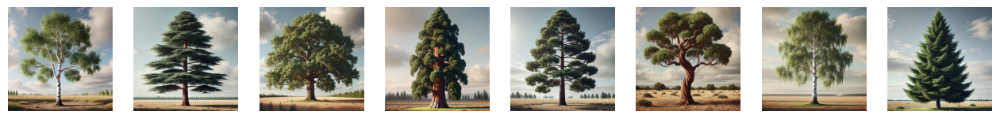

In [3]:
shape = (220, 220)
sigma = 0


from PIL import Image

path = f'/home/hpinkard_waller/data/trees/low_res_noisy_{shape}_{sigma}/'

images = []
for name in os.listdir(path):
    img = Image.open(path + name)
    img = np.array(img)
    images.append(img)

# plot some
fig, axs = plt.subplots(1, 8, figsize=(16, 2))
for ax, img in zip(axs, images):
    ax.imshow(img)
    ax.axis('off')

images = np.array(images)

# Single tree increasing noise

In [ ]:
shape = (128, 128)
sigmas = np.linspace(10, 240, 50)

# load tree1 high res
tree1 = Image.open('/home/hpinkard_waller/data/trees/high_res/tree01.png')
tree1 = np.array(tree1)

# resize
tree1 = np.array(Image.fromarray(tree1).resize(shape))

# make 30 noisy versions
noisy_tree1 = np.array([add_noise(tree1, gaussian_sigma=s) for s in sigmas])
# clip to 0 255
noisy_tree1 = np.clip(noisy_tree1, 0, 255) / 255

# save to uncompressed pngs
for i, img in enumerate(noisy_tree1):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/noisy_tree_movie/{i}.png')

!rm /home/hpinkard_waller/figures/trees_changing_noise/noisy_tree1.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/noisy_tree_movie/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_noise/noisy_tree1.mp4

In [16]:
blur_sequence 

array([ 0.04472136,  0.05767042,  0.07436888,  0.09590238,  0.12367089,
        0.15947978,  0.20565712,  0.2652051 ,  0.34199519,  0.44101983,
        0.56871705,  0.73338897,  0.94574161,  1.21958092,  1.57271036,
        2.02808836,  2.61532097,  3.37258669,  4.34911855,  5.60840504,
        7.23231771,  9.32643399, 12.02690127, 15.50928836, 20.        ,
       20.        , 15.50928836, 12.02690127,  9.32643399,  7.23231771,
        5.60840504,  4.34911855,  3.37258669,  2.61532097,  2.02808836,
        1.57271036,  1.21958092,  0.94574161,  0.73338897,  0.56871705,
        0.44101983,  0.34199519,  0.2652051 ,  0.20565712,  0.15947978,
        0.12367089,  0.09590238,  0.07436888,  0.05767042,  0.04472136])

# Single tree resolution loss

In [23]:
shape = (128, 128)

from scipy.ndimage import gaussian_filter

num_frames = 50
initial_blur_sigma = 0  # Start at full resolution (no blur)
max_blur_sigma = 20     # Maximum blur
min_blur_sigma = 0.0001      # No blur (full resolution)

blur_sequence = np.logspace(np.log10(min_blur_sigma), np.log10(max_blur_sigma), num_frames)

blur_sequence = blur_sequence ** 0.5
blur_sequence = blur_sequence / np.max(blur_sequence) * max_blur_sigma


# load tree1 high res
tree1 = Image.open('/home/hpinkard_waller/data/trees/high_res/tree01.png')
tree1 = np.array(tree1)

# resize
tree1 = np.array(Image.fromarray(tree1).resize(shape))

# make 30 noisy versions
blurred_tree1 = np.array([apply_gaussian_blur(tree1, sigma=s) for s in blur_sequence])
# clip to 0 255
blurred_tree1 = np.clip(blurred_tree1, 0, 255) / 255

# save to uncompressed pngs
for i, img in enumerate(blurred_tree1):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/blurred_tree_movie/{i}.png')

!rm /home/hpinkard_waller/figures/trees_changing_blur/blurry_tree1.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/blurred_tree_movie/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_blur/blurry_tree1.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

# Color loss

In [26]:
shape = (128, 128)
from scipy.ndimage import gaussian_filter
from encoding_information import add_noise

num_frames = 50

# Saturation sequence: starts at 1 (full color) and goes to 0 (grayscale)
saturation_sequence = np.linspace(1, 0, num_frames)

# Fixed blur and noise levels
fixed_blur_sigma = 3.0
fixed_noise_sigma = 15

def apply_gaussian_blur(image, sigma):
    if sigma == 0:
        return image
    
    if len(image.shape) == 2:
        return gaussian_filter(image, sigma=sigma)
    else:
        blurred = np.zeros_like(image)
        for i in range(image.shape[2]):
            blurred[:, :, i] = gaussian_filter(image[:, :, i], sigma=sigma)
        return blurred

def apply_desaturation(image, saturation):
    if saturation == 1:
        return image
    
    image_float = image.astype(float)
    grayscale = 0.299 * image_float[:, :, 0] + 0.587 * image_float[:, :, 1] + 0.114 * image_float[:, :, 2]
    grayscale_3channel = np.stack([grayscale, grayscale, grayscale], axis=2)
    desaturated = saturation * image_float + (1 - saturation) * grayscale_3channel
    return desaturated

# Load tree1 high res
tree1 = Image.open('/home/hpinkard_waller/data/trees/high_res/tree01.png')
tree1 = np.array(tree1)
# Resize
tree1 = np.array(Image.fromarray(tree1).resize(shape))

# Apply blur first
blurred_tree1 = apply_gaussian_blur(tree1, fixed_blur_sigma)

# Add noise
noisy_blurred_tree1 = add_noise(blurred_tree1, gaussian_sigma=fixed_noise_sigma, seed=0)

# Apply desaturation sequence
desaturated_sequence = np.array([apply_desaturation(noisy_blurred_tree1, s) for s in saturation_sequence])

# Clip to 0 255
desaturated_sequence = np.clip(desaturated_sequence, 0, 255) / 255

# Save to uncompressed pngs
for i, img in enumerate(desaturated_sequence):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/desaturated_tree_movie/{i}.png')

!rm /home/hpinkard_waller/figures/trees_changing_saturation/desaturated_tree1.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/desaturated_tree_movie/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_saturation/desaturated_tree1.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

# A bunch random combos of noise, color, resolutiopn

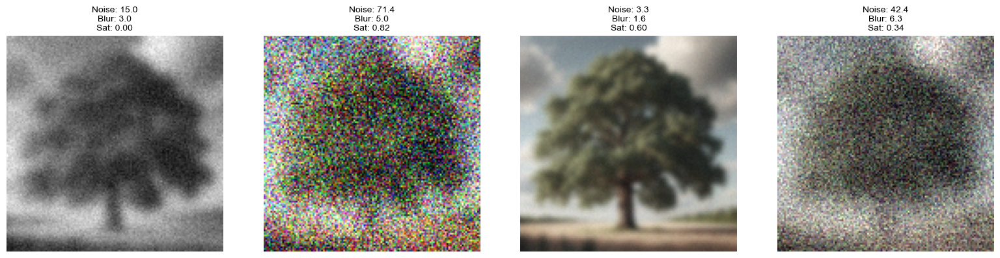

In [39]:
shape = (128, 128)
from scipy.ndimage import gaussian_filter
from encoding_information import add_noise
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Settings from desaturation animation
num_frames = 50
saturation_sequence = np.linspace(1, 0, num_frames)
fixed_blur_sigma = 3.0
fixed_noise_sigma = 15

# Define the ranges for random sampling
noise_range = (0, 80)
blur_range = (0, 15)
saturation_range = (0, 1)

def apply_gaussian_blur(image, sigma):
    if sigma == 0:
        return image
    
    if len(image.shape) == 2:
        return gaussian_filter(image, sigma=sigma)
    else:
        blurred = np.zeros_like(image)
        for i in range(image.shape[2]):
            blurred[:, :, i] = gaussian_filter(image[:, :, i], sigma=sigma)
        return blurred

def apply_desaturation(image, saturation):
    if saturation == 1:
        return image
    
    image_float = image.astype(float)
    grayscale = 0.299 * image_float[:, :, 0] + 0.587 * image_float[:, :, 1] + 0.114 * image_float[:, :, 2]
    grayscale_3channel = np.stack([grayscale, grayscale, grayscale], axis=2)
    desaturated = saturation * image_float + (1 - saturation) * grayscale_3channel
    return desaturated

# Load tree1
tree1 = Image.open('/home/hpinkard_waller/data/trees/high_res/tree01.png')
tree1 = np.array(tree1)
tree1 = np.array(Image.fromarray(tree1).resize(shape))

# Set random seed
np.random.seed(6)

# Create 4 variations
num_variations = 4
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

# First image: final settings from desaturation animation
blur_sigma = fixed_blur_sigma
noise_sigma = fixed_noise_sigma
saturation = saturation_sequence[-1]  # Last value (most desaturated)

blurred = apply_gaussian_blur(tree1, blur_sigma)
noisy = add_noise(blurred, gaussian_sigma=noise_sigma, seed=0)
desaturated = apply_desaturation(noisy, saturation)
final_image = np.clip(desaturated, 0, 255) / 255

axes[0].imshow(final_image)
axes[0].set_title(f'Noise: {noise_sigma:.1f}\nBlur: {blur_sigma:.1f}\nSat: {saturation:.2f}', 
                  fontsize=10)
axes[0].axis('off')

# Remaining 3 images: random parameters
for i in range(1, num_variations):
    # Randomly sample parameters
    noise_sigma = np.random.uniform(*noise_range)
    blur_sigma = np.random.uniform(*blur_range)
    saturation = np.random.uniform(*saturation_range)
    
    # Apply transformations
    blurred = apply_gaussian_blur(tree1, blur_sigma)
    noisy = add_noise(blurred, gaussian_sigma=noise_sigma, seed=i)
    desaturated = apply_desaturation(noisy, saturation)
    
    # Clip and normalize
    final_image = np.clip(desaturated, 0, 255) / 255
    
    # Display
    axes[i].imshow(final_image)
    axes[i].set_title(f'Noise: {noise_sigma:.1f}\nBlur: {blur_sigma:.1f}\nSat: {saturation:.2f}', 
                      fontsize=10)
    axes[i].axis('off')

plt.tight_layout()
fig.savefig('/home/hpinkard_waller/figures/tree1_random_variations.pdf', dpi=200, bbox_inches='tight')
plt.show()

# diverse vs non-diverse signals

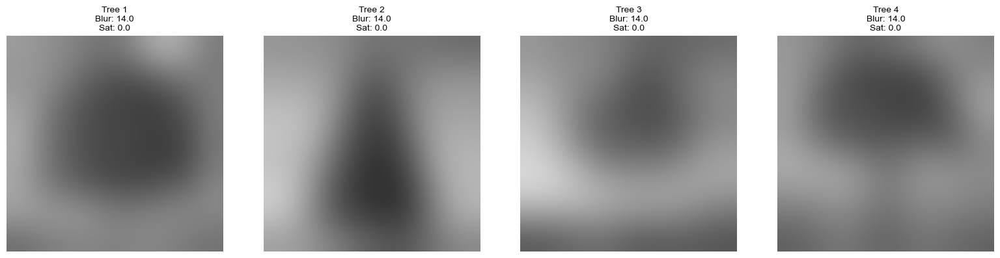

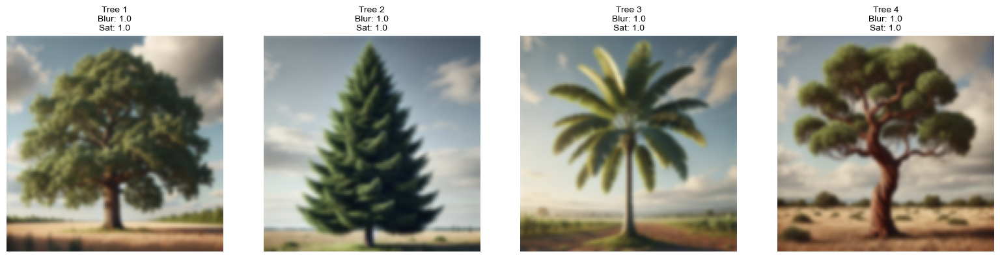

In [43]:
shape = (128, 128)
from scipy.ndimage import gaussian_filter
from encoding_information import add_noise
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Settings
fixed_noise_sigma = 0
high_blur_sigma = 14.0
low_blur_sigma = 1.0
full_saturation = 1.0
no_saturation = 0.0

def apply_gaussian_blur(image, sigma):
    if sigma == 0:
        return image
    
    if len(image.shape) == 2:
        return gaussian_filter(image, sigma=sigma)
    else:
        blurred = np.zeros_like(image)
        for i in range(image.shape[2]):
            blurred[:, :, i] = gaussian_filter(image[:, :, i], sigma=sigma)
        return blurred

def apply_desaturation(image, saturation):
    if saturation == 1:
        return image
    
    image_float = image.astype(float)
    grayscale = 0.299 * image_float[:, :, 0] + 0.587 * image_float[:, :, 1] + 0.114 * image_float[:, :, 2]
    grayscale_3channel = np.stack([grayscale, grayscale, grayscale], axis=2)
    desaturated = saturation * image_float + (1 - saturation) * grayscale_3channel
    return desaturated

# Load 4 different trees
path = '/home/hpinkard_waller/data/trees/high_res/'
tree_files = sorted(os.listdir(path))[:4]
trees = []
for tree_file in tree_files:
    tree = Image.open(os.path.join(path, tree_file))
    tree = np.array(tree)
    tree = np.array(Image.fromarray(tree).resize(shape))
    trees.append(tree)

# Set 1: High blur + No color (grayscale)
fig1, axes1 = plt.subplots(1, 4, figsize=(16, 4))
for i in range(4):
    blurred = apply_gaussian_blur(trees[i], high_blur_sigma)
    noisy = add_noise(blurred, gaussian_sigma=fixed_noise_sigma, seed=i)
    desaturated = apply_desaturation(noisy, no_saturation)
    final_image = np.clip(desaturated, 0, 255) / 255
    
    axes1[i].imshow(final_image)
    axes1[i].set_title(f'Tree {i+1}\nBlur: {high_blur_sigma:.1f}\nSat: {no_saturation:.1f}', 
                      fontsize=10)
    axes1[i].axis('off')

plt.tight_layout()
fig1.savefig('/home/hpinkard_waller/figures/trees_high_blur_no_color.pdf', dpi=200, bbox_inches='tight')
plt.show()

# Set 2: Low blur + Full color
fig2, axes2 = plt.subplots(1, 4, figsize=(16, 4))
for i in range(4):
    blurred = apply_gaussian_blur(trees[i], low_blur_sigma)
    noisy = add_noise(blurred, gaussian_sigma=fixed_noise_sigma, seed=i)
    desaturated = apply_desaturation(noisy, full_saturation)
    final_image = np.clip(desaturated, 0, 255) / 255
    
    axes2[i].imshow(final_image)
    axes2[i].set_title(f'Tree {i+1}\nBlur: {low_blur_sigma:.1f}\nSat: {full_saturation:.1f}', 
                      fontsize=10)
    axes2[i].axis('off')

plt.tight_layout()
fig2.savefig('/home/hpinkard_waller/figures/trees_low_blur_full_color.pdf', dpi=200, bbox_inches='tight')
plt.show()

# Trees changing noise level

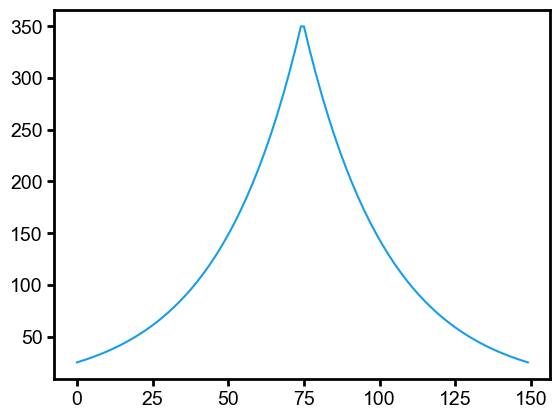

In [11]:
# GEnerate the noise sequence

num_frames=150

initial_noise_std=100
max_noise_std=350
min_noise_std=25

# Define key points for noise levels
noise_sequence = np.logspace(np.log10(min_noise_std), np.log10(max_noise_std), num_frames // 2)
noise_sequence = np.concatenate([noise_sequence, noise_sequence[::-1]])
# find the offset to the initial noise level
# roll_offset = np.where(noise_sequence > initial_noise_std)[0][0]
# noise_sequence = np.roll(noise_sequence, -int(roll_offset))


# plot noise sequence
fig, ax = plt.subplots()
ax.plot(noise_sequence)

100%|██████████| 150/150 [01:28<00:00,  1.70it/s]


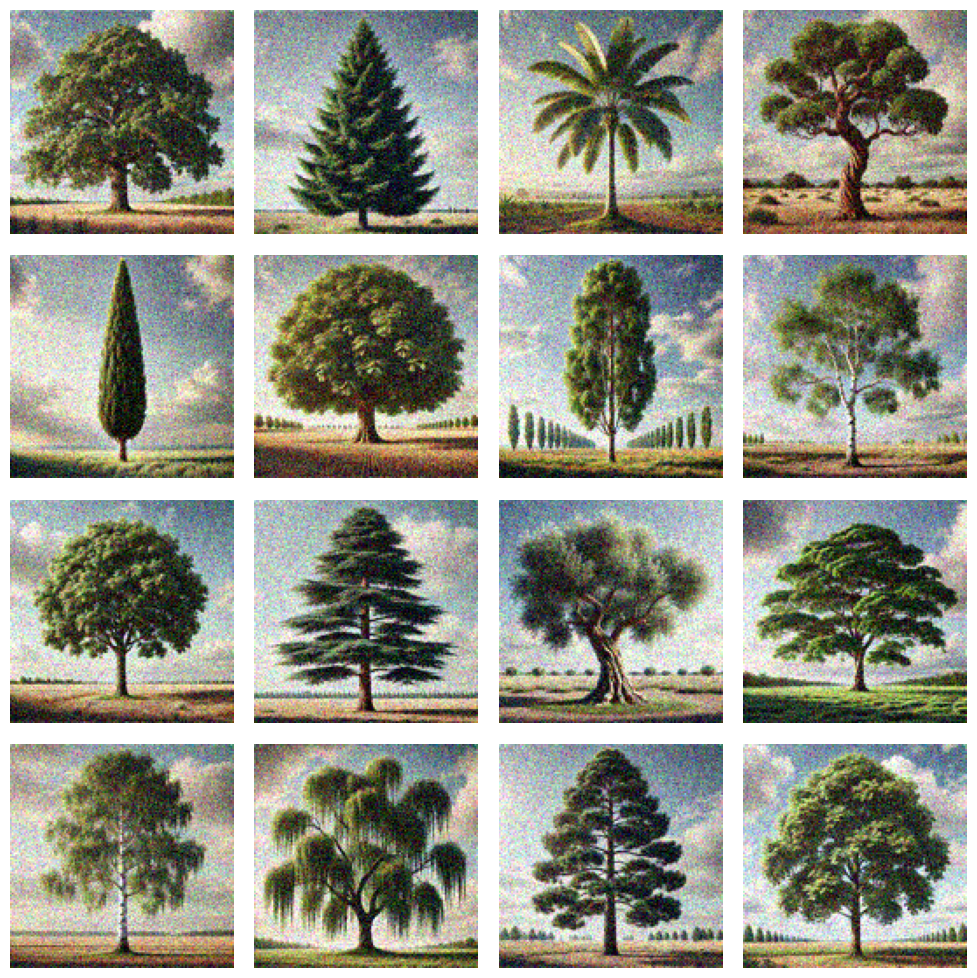

In [12]:
# shape = (220, 220)
shape = (128, 128)
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
from scipy.stats import multivariate_normal
from encoding_information import add_noise
from cleanplots import *
from annimations_utils import *
import matplotlib.gridspec as gridspec

# gaussian_noise_sigma = np.logspace(0, 1.5, num_frames)
gaussian_noise_sigma = noise_sequence
name = 'noisy_encoder_comparison'

# Set up directories to save frames
def setup_frames_dir(directory_name):
    save_path = os.path.join('/home/hpinkard_waller/figures/trees_changing_noise/', directory_name)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    # clear the directory
    for file in os.listdir(save_path):
        os.remove(os.path.join(save_path, file))
    return save_path

save_dir = '/home/hpinkard_waller/figures/trees_changing_noise/'
save_path1 = setup_frames_dir(name)

# Load tree images
path = '/home/hpinkard_waller/data/trees/high_res/'
image_names = sorted(os.listdir(path))[:16]  # Take only first 16 images
images = []
for name in image_names:
    img = Image.open(os.path.join(path, name))
    img = img.resize(shape) 
    img = np.array(img)
    images.append(img)

# Ensure images are numpy arrays
images = [np.array(img) for img in images]

# generate the noisy images
for frame_num in tqdm(range(num_frames)):
    seed = frame_num
    
    # Create a figure for noisy images with 4x4 grid
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(4, 4)
    
    for j in range(16):
        row = j // 4
        col = j % 4
        ax = fig.add_subplot(gs[row, col])
        
        image = images[j]
        # Add Gaussian noise with changing sigma
        noisy_image = add_noise(image, gaussian_sigma=gaussian_noise_sigma[frame_num], seed=frame_num)
        # clip to 0 255
        noisy_image = np.clip(noisy_image, 0, 255) / 255
        
        # Display the noisy image without border
        ax.imshow(noisy_image)
        ax.axis('off')  # Hide axes for cleaner visualization
    
    plt.tight_layout()
    
    # Save the figure containing noisy images
    fig.savefig(f"{save_path1}/image_{frame_num:04d}.png", dpi=100, bbox_inches='tight')
    if frame_num != 0:
        plt.close(fig)

In [13]:
!rm /home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison/image_%04d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_noise/16_images_changing_noise.mp4

rm: cannot remove '/home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison.mp4': No such file or directory
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --ena

## Reduce resolution

Text(0.5, 1.0, 'Blur sequence over time')

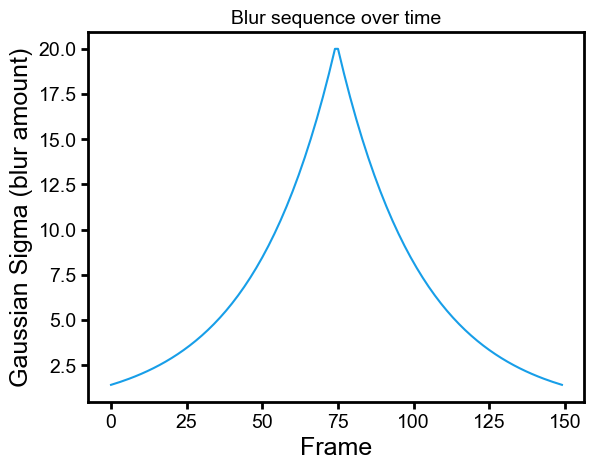

In [25]:
num_frames = 150

initial_blur_sigma = 0  # Start at full resolution (no blur)
max_blur_sigma = 20     # Maximum blur
min_blur_sigma = 0.1      # No blur (full resolution)

# Define key points for blur levels
# Start at 0, go to max, then back to 0
# blur_sequence = np.linspace(min_blur_sigma, max_blur_sigma, num_frames // 2)
blur_sequence = np.logspace(np.log10(min_blur_sigma), np.log10(max_blur_sigma), num_frames // 2)
blur_sequence = np.concatenate([blur_sequence, blur_sequence[::-1]])

blur_sequence = blur_sequence ** 0.5
blur_sequence = blur_sequence / np.max(blur_sequence) * max_blur_sigma


# Plot blur sequence
fig, ax = plt.subplots()
ax.plot(blur_sequence)
ax.set_ylabel('Gaussian Sigma (blur amount)')
ax.set_xlabel('Frame')
ax.set_title('Blur sequence over time')

100%|██████████| 150/150 [01:37<00:00,  1.54it/s]


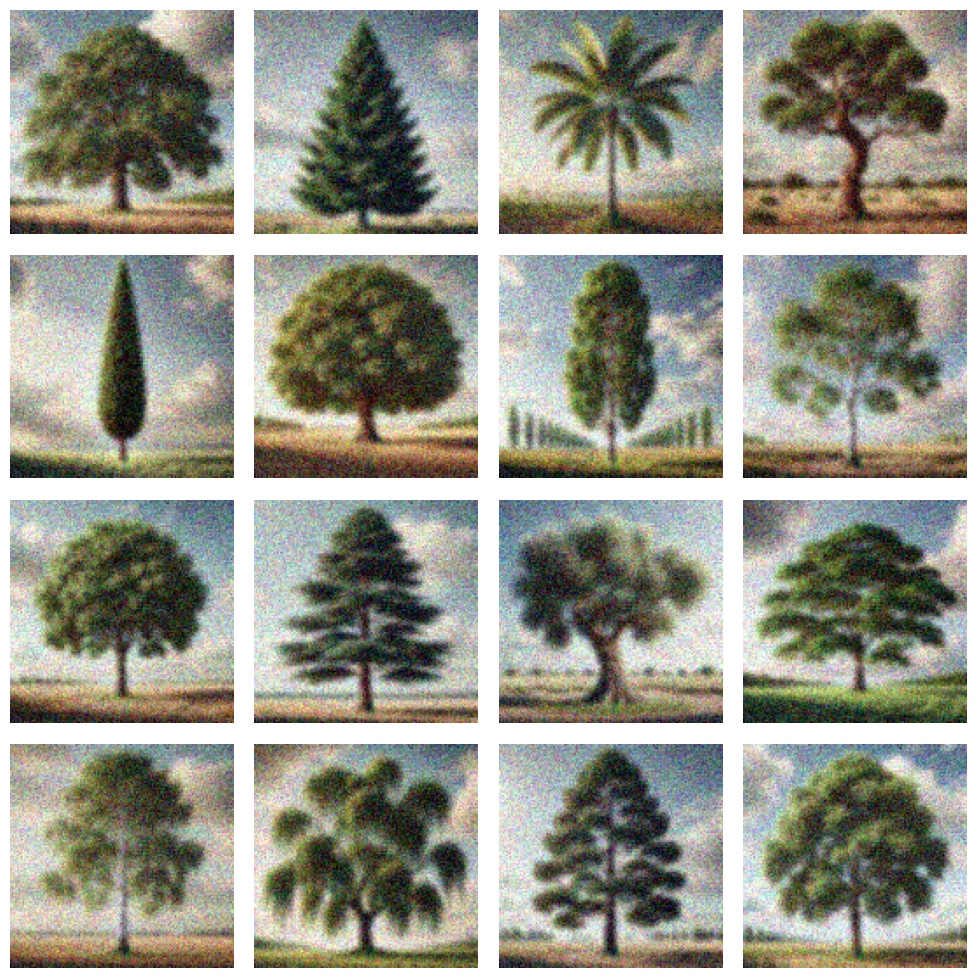

In [ ]:
shape = (128, 128)

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
from scipy.ndimage import gaussian_filter
from encoding_information import add_noise
from cleanplots import *
from annimations_utils import *
import matplotlib.gridspec as gridspec

name = 'blurry_encoder_comparison'

# Set up directories to save frames
def setup_frames_dir(directory_name):
    save_path = os.path.join('/home/hpinkard_waller/figures/trees_changing_resolution/', directory_name)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    # Clear the directory
    for file in os.listdir(save_path):
        os.remove(os.path.join(save_path, file))
    return save_path

save_dir = '/home/hpinkard_waller/figures/trees_changing_resolution/'
save_path1 = setup_frames_dir(name)

# Load tree images
path = '/home/hpinkard_waller/data/trees/high_res/'
image_names = sorted(os.listdir(path))[:16]  # Take only first 16 images
images = []

for name in image_names:
    img = Image.open(os.path.join(path, name))
    img = img.resize(shape) 
    img = np.array(img)
    images.append(img)

# Ensure images are numpy arrays
images = [np.array(img) for img in images]




# Generate the blurry and noisy images
for frame_num in tqdm(range(num_frames)):
    # Create a figure for blurry images with 4x4 grid
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(4, 4)

    for j in range(16):
        row = j // 4
        col = j % 4
        ax = fig.add_subplot(gs[row, col])
        
        image = images[j]
                
        # apply Gaussian blur
        blurry_image = apply_gaussian_blur(image, blur_sequence[frame_num])

        blurry_noisy_image = add_noise(blurry_image, gaussian_sigma=min_noise_std, seed=seed)

        # Normalize to 0-1 range
        blurry_noisy_image = np.clip(blurry_noisy_image, 0, 255) / 255

        # Display the blurry noisy image without border
        ax.imshow(blurry_noisy_image)
        ax.axis('off')  # Hide axes for cleaner visualization

    plt.tight_layout()

    # Save the figure containing blurry noisy images
    fig.savefig(f"{save_path1}/image_{frame_num:04d}.png", dpi=100, bbox_inches='tight')
    if frame_num != 0:
        plt.close(fig)

In [27]:
!rm /home/hpinkard_waller/figures/trees_changing_resolution/blurry_encoder_comparison.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/figures/trees_changing_resolution/blurry_encoder_comparison/image_%04d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_resolution/16_images_changing_resolution.mp4

rm: cannot remove '/home/hpinkard_waller/figures/trees_changing_resolution/blurry_encoder_comparison.mp4': No such file or directory
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy

## Reduce color

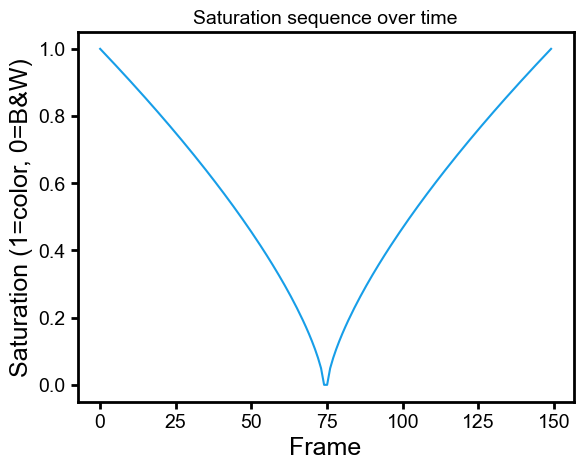

In [17]:
# Generate the saturation sequence

# TODOOOOOO
final_image_blur = 6

num_frames = 150

# Saturation goes from 1 (full color) to 0 (black and white) and back
min_saturation = 0  # Black and white
max_saturation = 1  # Full color

# Start at full color, go to black and white, then back to full color
saturation_sequence = np.linspace(max_saturation, min_saturation, num_frames // 2)
saturation_sequence = np.concatenate([saturation_sequence, saturation_sequence[::-1]])

saturation_sequence = saturation_sequence ** 0.7

# Plot saturation sequence
fig, ax = plt.subplots()
ax.plot(saturation_sequence)
ax.set_ylabel('Saturation (1=color, 0=B&W)')
ax.set_xlabel('Frame')
ax.set_title('Saturation sequence over time')

# Constant noise level
noise_std = 25  # You can adjust this value

100%|██████████| 150/150 [01:47<00:00,  1.40it/s]


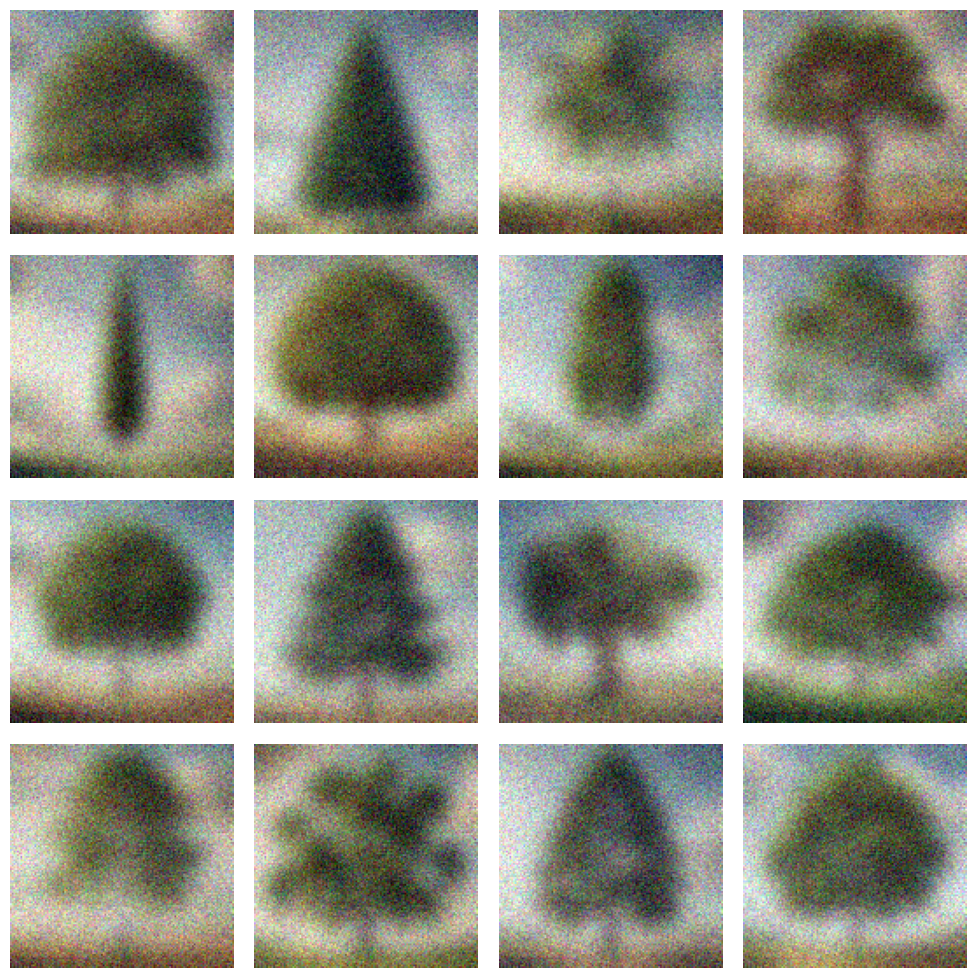

In [18]:
shape = (128, 128)
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
from encoding_information import add_noise
from cleanplots import *
from annimations_utils import *
import matplotlib.gridspec as gridspec

name = 'desaturate_encoder_comparison'

# Set up directories to save frames
def setup_frames_dir(directory_name):
    save_path = os.path.join('/home/hpinkard_waller/figures/trees_changing_saturation/', directory_name)
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    # Clear the directory
    for file in os.listdir(save_path):
        os.remove(os.path.join(save_path, file))
    return save_path

save_dir = '/home/hpinkard_waller/figures/trees_changing_saturation/'
save_path1 = setup_frames_dir(name)

# Load tree images
path = '/home/hpinkard_waller/data/trees/high_res/'
image_names = sorted(os.listdir(path))[:16]  # Take only first 16 images
images = []

for name in image_names:
    img = Image.open(os.path.join(path, name))
    img = img.resize(shape) 
    img = np.array(img)
    images.append(img)

# Ensure images are numpy arrays
images = [np.array(img) for img in images]

def apply_desaturation(image, saturation):
    """
    Adjust the saturation of an image.
    
    Args:
        image: Input image (H, W, C) - assumed to be RGB
        saturation: Saturation level from 0 (grayscale) to 1 (full color)
    
    Returns:
        Desaturated image with same shape as input
    """
    if saturation == 1:
        return image
    
    # Convert to float for processing
    image_float = image.astype(float)
    
    # Calculate grayscale using standard luminance weights
    # These weights account for human perception of different colors
    grayscale = 0.299 * image_float[:, :, 0] + 0.587 * image_float[:, :, 1] + 0.114 * image_float[:, :, 2]
    
    # Expand grayscale to 3 channels
    grayscale_3channel = np.stack([grayscale, grayscale, grayscale], axis=2)
    
    # Interpolate between grayscale and original color
    desaturated = saturation * image_float + (1 - saturation) * grayscale_3channel
    
    return desaturated

# Generate the desaturated and noisy images
for frame_num in tqdm(range(num_frames)):
    # Create a figure with 4x4 grid
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(4, 4)

    for j in range(16):
        row = j // 4
        col = j % 4
        ax = fig.add_subplot(gs[row, col])
        
        image = images[j]
        
        blurry_image = apply_gaussian_blur(image, final_image_blur)
        # First add Gaussian noise (constant level)
        noisy_image = add_noise(blurry_image, gaussian_sigma=noise_std, seed=seed)
        
        # Then apply desaturation
        desaturated_noisy_image = apply_desaturation(noisy_image, saturation_sequence[frame_num])
        # Normalize to 0-1 range
        desaturated_noisy_image = np.clip(desaturated_noisy_image, 0, 255) / 255
        
        # Display the desaturated noisy image without border
        ax.imshow(desaturated_noisy_image)
        ax.axis('off')  # Hide axes for cleaner visualization

    plt.tight_layout()

    # Save the figure
    fig.savefig(f"{save_path1}/image_{frame_num:04d}.png", dpi=100, bbox_inches='tight')
    if frame_num != 0:
        plt.close(fig)

In [19]:
!rm /home/hpinkard_waller/figures/trees_changing_saturation/desaturate_encoder_comparison.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/figures/trees_changing_saturation/desaturate_encoder_comparison/image_%04d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_saturation/16_images_changing_saturation.mp4

rm: cannot remove '/home/hpinkard_waller/figures/trees_changing_saturation/desaturate_encoder_comparison.mp4': No such file or directory
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsn

# Single image examples of noise resoiltuon color

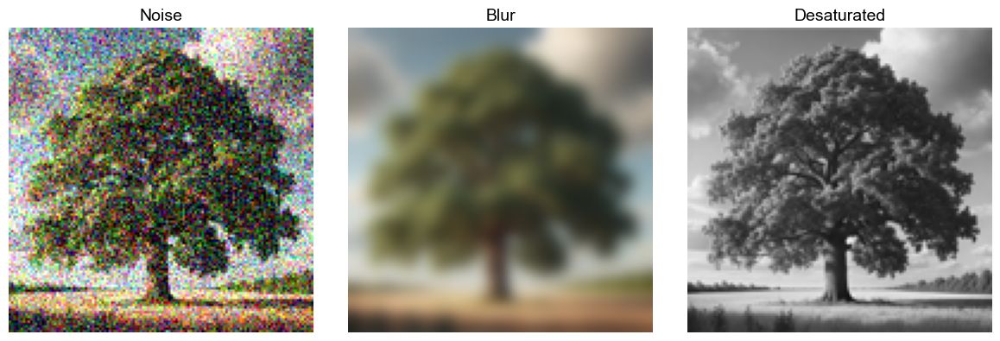

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.ndimage import gaussian_filter
from encoding_information import add_noise

# Load tree 1
shape = (128, 128)
path = '/home/hpinkard_waller/data/trees/'
img = Image.open(path + 'tree1_clean.png')
img = img.resize(shape)
image = np.array(img)

# Apply transformations
noisy_image = add_noise(image, gaussian_sigma=50, seed=0)
noisy_image = np.clip(noisy_image, 0, 255) / 255

blurred_image = gaussian_filter(image, sigma=3)
if len(blurred_image.shape) == 3:
    blurred_channels = np.zeros_like(image)
    for i in range(image.shape[2]):
        blurred_channels[:, :, i] = gaussian_filter(image[:, :, i], sigma=3)
    blurred_image = blurred_channels
blurred_image = np.clip(blurred_image, 0, 255) / 255

grayscale = 0.299 * image[:, :, 0] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 2]
desaturated_image = np.stack([grayscale, grayscale, grayscale], axis=2)
desaturated_image = np.clip(desaturated_image, 0, 255) / 255

# Create figure
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(noisy_image)
axes[0].set_title('Noise')
axes[0].axis('off')

axes[1].imshow(blurred_image)
axes[1].set_title('Blur')
axes[1].axis('off')

axes[2].imshow(desaturated_image)
axes[2].set_title('Desaturated')
axes[2].axis('off')

plt.tight_layout()
fig.savefig('/home/hpinkard_waller/figures/tree1_transformations.pdf', dpi=200, bbox_inches='tight')
plt.show()

## Color blobs?

In [44]:
from matplotlib.colors import LinearSegmentedColormap

cmaps = [LinearSegmentedColormap.from_list(f'cmap_magenta', [(1,1,1), get_color_cycle()[0]]),
        LinearSegmentedColormap.from_list(f'cmap_magenta', [(1,1,1), get_color_cycle()[2]]),
        LinearSegmentedColormap.from_list(f'cmap_magenta', [(1,1,1), '#00A595'])]


name2 = 'noisy_encoder_comparison_density'
save_path2 = setup_frames_dir(name2)

num_frames = 150


# Define min and max sigma values
max_sigma = 0.01
min_sigma = 1e-5

# Calculate the logarithmic positions from the previous cell
log_min_noise_std = np.log10(min_noise_std)
log_max_noise_std = np.log10(max_noise_std)
log_initial_noise_std = np.log10(initial_noise_std)
proportion = (log_initial_noise_std - log_min_noise_std) / (log_max_noise_std - log_min_noise_std)

# Compute the corresponding initial_sigma
log_min_sigma = np.log10(min_sigma)
log_max_sigma = np.log10(max_sigma)
log_initial_sigma = log_min_sigma + proportion * (log_max_sigma - log_min_sigma)
initial_sigma = 10 ** log_initial_sigma

# Generate the sigma sequence
half_frames = num_frames // 2
display_sigma = np.logspace(log_min_sigma, log_max_sigma, half_frames)
display_sigma = np.concatenate([display_sigma, display_sigma[::-1]])

# Roll the sequence to start at initial_sigma
roll_offset = np.where(display_sigma > initial_sigma)[0][0]
display_sigma = np.roll(display_sigma, -int(roll_offset))



# Define point centers for density plots
point_centers = np.array([[0.576, 0.475],
                            [0.42, 0.4345],
                          [0.51, 0.58],])
point_centers =  (point_centers + 0.5) / 2

# Blend the densities for the three points
for frame_num in tqdm(range(num_frames)):
    # Create a figure for density plots
    fig, ax_density = plt.subplots(1, 1, figsize=(3, 3))

    # Generate a 2D Gaussian density plot
    cov = np.eye(2) * display_sigma[frame_num]
    densities = []
    x = np.linspace(0, 1, 300)
    y = np.linspace(0, 1, 300)
    X, Y = np.meshgrid(x, y)
    pos = np.dstack((X, Y))

    for mu in point_centers:
        prob = multivariate_normal.pdf(pos, mu, cov)
        prob /= np.max(prob)
        densities.append(prob)

    # Blend densities using the specified colormaps
    blended_color = np.prod(np.stack([cmap(hist) for cmap, hist in 
                                        zip(cmaps, densities)], axis=0), axis=0)

    # Display the density plot
    ax_density.imshow(blended_color, origin='lower')
    clear_spines(ax_density)
    ax_density.set(xticks=[], yticks=[])

    # Save the figure containing the density plot
    fig.savefig(f"{save_path2}/image_{frame_num:04d}.png", dpi=300, bbox_inches='tight')
    # break
    plt.close(fig)
    
!rm /home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison_density.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison_density/image_%04d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/figures/trees_changing_noise/noisy_encoder_comparison_density.mp4

100%|██████████| 150/150 [00:31<00:00,  4.78it/s]

1388.55s - pydevd: Sending message related to process being replaced timed-out after 5 seconds
1394.21s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

# Compare 2 with hi-res noisy vs low-res less noisy

In [57]:
from PIL import Image
from encoding_information import add_noise

shape = (220, 220)
sigma = 200

# load tree1 high res
tree1 = Image.open('/home/hpinkard_waller/data/trees/cropped_for_alignment/tree1.png')
tree1 = np.array(tree1)

tree2 = Image.open('/home/hpinkard_waller/data/trees/cropped_for_alignment/tree2.png')
tree2 = np.array(tree2)

# resize
tree1 = np.array(Image.fromarray(tree1).resize(shape)).astype(np.float32)
tree2 = np.array(Image.fromarray(tree2).resize(shape)).astype(np.float32)

# make 30 noisy versions
noisy_tree1 = np.array([add_noise(tree1, gaussian_sigma=sigma) for _ in range(30)])
noisy_tree2 = np.array([add_noise(tree2, gaussian_sigma=sigma) for _ in range(30)])
noisy_tree1 = np.clip(noisy_tree1, 0, 255) / 255
noisy_tree2 = np.clip(noisy_tree2, 0, 255) / 255

# save to uncompressed pngs
for i, img in enumerate(noisy_tree1):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/hrhn1/{i}.png')

for i, img in enumerate(noisy_tree2):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/hrhn2/{i}.png')

# save the original hi res
img = Image.fromarray((tree1).astype(np.uint8))
img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/hi_res_clean_tree1.png')

img = Image.fromarray((tree2).astype(np.uint8))
img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/hi_res_clean_tree2.png')



In [58]:
!rm /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn1.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn1/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn1.mp4

!rm /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn2.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn2/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/res_noise_comparison/hrhn2.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

In [59]:
from scipy.ndimage import gaussian_filter

blur_sigma = 6
noise_sigma = 10


# Function to apply Gaussian blur to each channel
def blur_each_channel(image, sigma):
    blurred_image = np.zeros_like(image)
    for channel in range(3):  # Assuming the input is an RGB image
        blurred_image[:, :, channel] = gaussian_filter(image[:, :, channel], sigma=sigma, mode='reflect')
    return blurred_image

# Apply Gaussian blur to each channel independently
blurred_tree1 = blur_each_channel(tree1, blur_sigma)
blurred_tree2 = blur_each_channel(tree2, blur_sigma)

# # Normalize the blurred images to the range [0, 1]
# blurred_tree1 = np.clip(blurred_tree1 / 255, 0, 1)
# blurred_tree2 = np.clip(blurred_tree2 / 255, 0, 1)

# # plot 
# fig, axs = plt.subplots(1, 2, figsize=(8, 4))
# axs[0].imshow(blurred_tree1)
# axs[0].axis('off')
# axs[1].imshow(blurred_tree2)
# axs[1].axis('off')

# make 30 noisy versions
noisy_tree1 = np.array([add_noise(blurred_tree1, gaussian_sigma=noise_sigma) for _ in range(30)])
noisy_tree2 = np.array([add_noise(blurred_tree2, gaussian_sigma=noise_sigma) for _ in range(30)])
noisy_tree1 = np.clip(noisy_tree1, 0, 255) / 255
noisy_tree2 = np.clip(noisy_tree2, 0, 255) / 255

# save to uncompressed pngs
for i, img in enumerate(noisy_tree1):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/lrln1/{i}.png')

for i, img in enumerate(noisy_tree2):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/lrln2/{i}.png')

# save the clean blurry images
img = Image.fromarray((blurred_tree1).astype(np.uint8))
img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/blurry_tree1.png')

img = Image.fromarray((blurred_tree2).astype(np.uint8))
img.save(f'/home/hpinkard_waller/data/trees/res_noise_comparison/blurry_tree2.png')

In [60]:
!rm /home/hpinkard_waller/data/trees/res_noise_comparison/lrln1.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/res_noise_comparison/lrln1/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/res_noise_comparison/lrln1.mp4

!rm /home/hpinkard_waller/data/trees/res_noise_comparison/lrln2.mp4
!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/res_noise_comparison/lrln2/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/res_noise_comparison/lrln2.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

# Meaurement and noise distributions

In [1]:
# make a movie of the files in trees/low_res_noisy_(220, 220)_75
# animating at 15 fps

!rm /home/hpinkard_waller/data/trees/low_res_noisy_\(220\,\ 220\)_75.mp4
!ffmpeg -y -framerate 15 -i /home/hpinkard_waller/data/trees/low_res_noisy_\(220\,\ 220\)_75/noisy_%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/low_res_noisy_\(220\,\ 220\)_75.mp4

rm: cannot remove '/home/hpinkard_waller/data/trees/low_res_noisy_(220, 220)_75.mp4': No such file or directory
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --e

In [7]:
# make 30 frames of noise at 220 x 220 75 sigma
import numpy as np
from PIL import Image
import os

shape = (220, 220, 3)
sigma = 75

frames = np.random.randn(30, *shape) * sigma + 0.5
# clip to 0 1
frames = np.clip(frames, 0, 1)

# make the folder

if not os.path.exists('/home/hpinkard_waller/data/trees/noise_frames'):
    os.makedirs('/home/hpinkard_waller/data/trees/noise_frames')

# save to uncompressed pngs
for i, img in enumerate(frames):
    img = Image.fromarray((img * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/noise_frames/{i}.png')

!ffmpeg -y -framerate 30 -i /home/hpinkard_waller/data/trees/noise_frames/%d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p /home/hpinkard_waller/data/trees/noise_frames/noise.mp4


ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

# Dim noisy tree

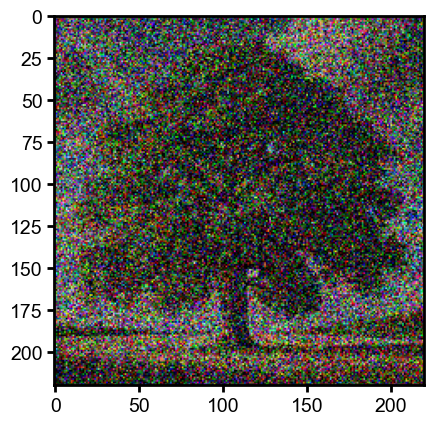

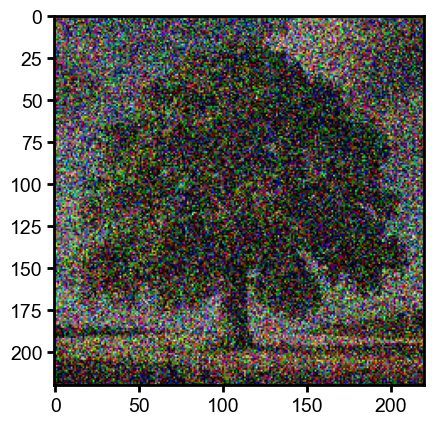

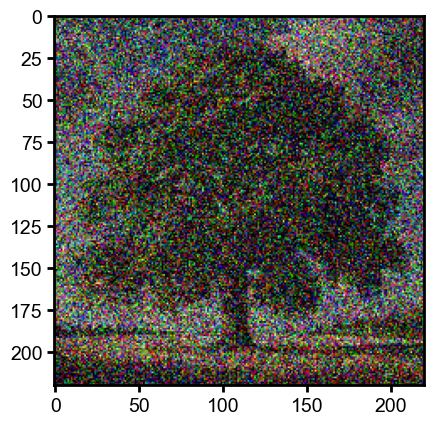

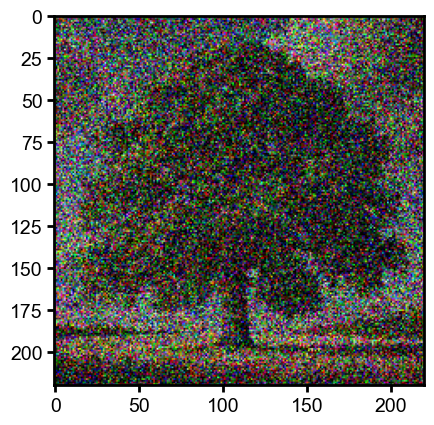

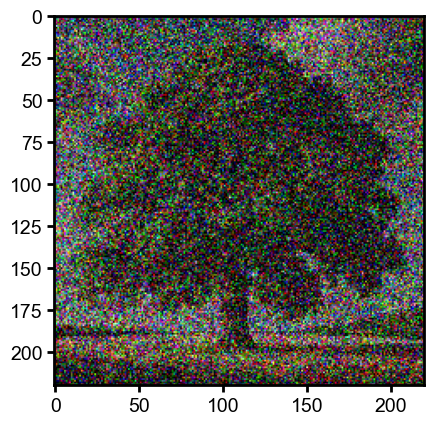

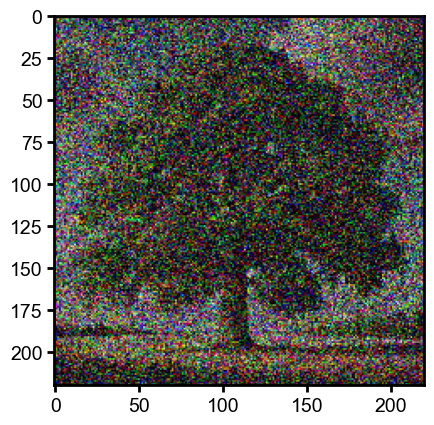

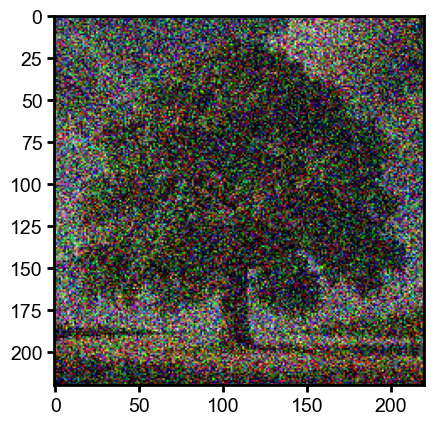

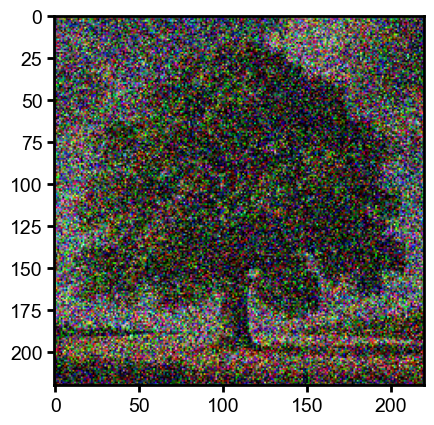

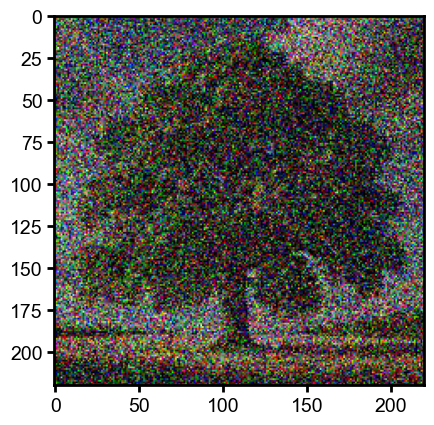

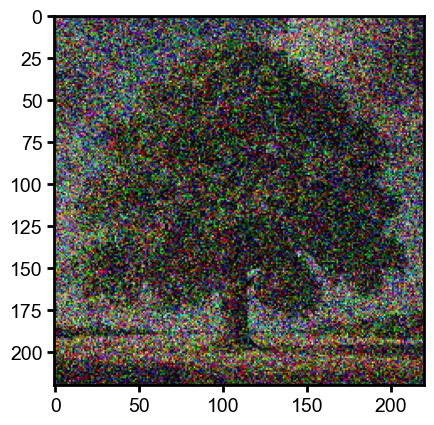

In [7]:
# make a 220 x 220 dim, noisy tree

from PIL import Image
import numpy as np
import os
from encoding_information import add_noise

shape = (220, 220)
sigma = 75
brightness = 0.5

# load tree1 high res
tree1 = Image.open('/home/hpinkard_waller/data/trees/high_res/tree1.png')
tree1 = np.array(tree1)

# resize
tree1 = np.array(Image.fromarray(tree1).resize(shape))

tree1 = brightness * tree1.astype(float)

for i in range(10):
    # add noise
    noisy_tree1 = add_noise(tree1, gaussian_sigma=sigma)

    # clip to 0 255
    noisy_tree1 = np.clip(noisy_tree1, 0, 255) / 255

    # plot
    fig, ax = plt.subplots()
    ax.imshow(noisy_tree1)

    # save the image as a png
    img = Image.fromarray((np.array(noisy_tree1) * 255).astype(np.uint8))
    img.save(f'/home/hpinkard_waller/data/trees/smartphone_burst_tree/{i}.png')



# Make cover animation

In [1]:
import numpy as np
from PIL import Image
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

# Assuming add_noise function is defined as follows:
def add_noise(image, gaussian_sigma):
    noise = np.random.normal(0, gaussian_sigma, image.shape)
    noisy_image = image + noise
    return noisy_image

# Load tree images
shape = (220, 220)
# open all trees in /home/hpinkard_waller/data/trees/high_res
trees = []
for name in os.listdir('/home/hpinkard_waller/data/trees/high_res'):
    img = Image.open(f'/home/hpinkard_waller/data/trees/high_res/{name}')
    img = img.resize(shape)
    img = np.array(img)
    trees.append(img)

# Parameters
grid_size = (8, 8)  # Grid size (rows, columns)
num_frames = 300     # Total number of frames in the animation
noise_period = 300          # Period of the sinusoidal functions
blur_period = 100          # Period of the sinusoidal functions

# Blur and noise parameters
min_blur = 0
max_blur = 15
min_noise = 0
max_noise = 150

# Output directory
output_dir = '/home/hpinkard_waller/data/trees/animation_frames'
os.makedirs(output_dir, exist_ok=True)
# clear the directory
for file in os.listdir(output_dir):
    os.remove(os.path.join(output_dir, file))

# Function to apply Gaussian blur to each channel
def blur_each_channel(image, sigma):
    blurred_image = np.zeros_like(image)
    for channel in range(3):  # Assuming RGB image
        blurred_image[:, :, channel] = gaussian_filter(image[:, :, channel], sigma=sigma, mode='reflect')
    return blurred_image

# Generate frames
for t in tqdm(range(num_frames)):
    # Initialize a list to hold the images for this frame
    row_images = []
    for y in range(grid_size[0]):  # Rows
        col_images = []
        for x in range(grid_size[1]):  # Columns
            # Compute blur and noise levels
            blur_phase = 2 * np.pi * y / grid_size[0]
            noise_phase = 2 * np.pi * x / grid_size[1]
            blur_sigma = min_blur + (max_blur - min_blur) * (np.sin(2 * np.pi * t / blur_period + blur_phase) + 1) / 2
            noise_sigma = min_noise + (max_noise - min_noise) * (np.sin(2 * np.pi * t / noise_period + noise_phase) + 1) / 2

            # pick a random tree
            np.random.seed(x + y)
            img = trees[np.random.randint(len(trees))]
            np.random.seed(None)

            # Apply blur and noise
            blurred_img = blur_each_channel(img, blur_sigma)
            noisy_img = add_noise(blurred_img, gaussian_sigma=noise_sigma)
            noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
            col_images.append(Image.fromarray(noisy_img))

        # Concatenate images horizontally
        row_image = np.hstack([np.array(img) for img in col_images])
        row_images.append(row_image)

    # Concatenate images vertically to form the grid
    frame_image = np.vstack(row_images)
    # resize and crop to full HD
    # first crop to 16:9 aspect ratio
    h, w = frame_image.shape[:2]
    # crop the height
    diff = h - w * 9 / 16
    frame_image = frame_image[:h - int(diff), :]
    frame_image = Image.fromarray(frame_image)
    frame_image = frame_image.resize((1920, 1080))
    frame_image.save(os.path.join(output_dir, f'frame_{t:03d}.png'))

# Create video using ffmpeg
video_output_path = '/home/hpinkard_waller/data/trees/animation.mp4'
os.system(f'ffmpeg -y -framerate 20 -i {output_dir}/frame_%03d.png -vf "scale=ceil(iw/2)*2:ceil(ih/2)*2" -vcodec libx264 -crf 23 -pix_fmt yuv420p {video_output_path}')


100%|██████████| 300/300 [04:51<00:00,  1.03it/s]
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-lib

0

In [2]:
import numpy as np
from PIL import Image
from scipy.ndimage import gaussian_filter
import os

# Function to add Gaussian noise to an image
def add_noise(image, gaussian_sigma):
    noise = np.random.normal(0, gaussian_sigma, image.shape)
    noisy_image = image + noise
    return noisy_image

# Function to apply Gaussian blur to each channel of an image
def blur_each_channel(image, sigma):
    blurred_image = np.zeros_like(image)
    for channel in range(3):  # Assuming RGB image
        blurred_image[:, :, channel] = gaussian_filter(
            image[:, :, channel], sigma=sigma, mode='reflect'
        )
    return blurred_image

# Parameters
shape = (220, 220)  # Resize shape for each tree image
grid_size = (8, 8)  # Grid size (rows, columns)
min_blur = 0        # Minimum blur level
max_blur = 13      # Maximum blur level
min_noise = 0       # Minimum noise level
max_noise = 120     # Maximum noise level

# Directories (update these paths as needed)
tree_dir = '/home/hpinkard_waller/data/trees/high_res'
output_path = '/home/hpinkard_waller/data/trees/montage.png'

# Load tree images
trees = []
for name in os.listdir(tree_dir):
    img_path = os.path.join(tree_dir, name)
    img = Image.open(img_path).resize(shape)
    trees.append(np.array(img))

# Generate the montage image
row_images = []
for y in range(grid_size[0]):  # Rows
    col_images = []
    for x in range(grid_size[1]):  # Columns
        # Generate random blur and noise levels within limits
        blur_sigma = np.random.uniform(min_blur, max_blur)
        noise_sigma = np.random.uniform(min_noise, max_noise)

        # Pick a random tree image
        img = trees[np.random.randint(len(trees))]

        # Apply blur and noise
        blurred_img = blur_each_channel(img, blur_sigma)
        noisy_img = add_noise(blurred_img, gaussian_sigma=noise_sigma)
        noisy_img = np.clip(noisy_img, 0, 255).astype(np.uint8)
        col_images.append(noisy_img)

    # Concatenate images horizontally
    row_image = np.hstack(col_images)
    row_images.append(row_image)

# Concatenate images vertically to form the grid
montage_image = np.vstack(row_images)

# Crop to 16:9 aspect ratio and resize to 1920x1080
h, w = montage_image.shape[:2]
target_aspect_ratio = 16 / 9
current_aspect_ratio = w / h

if current_aspect_ratio > target_aspect_ratio:
    # Crop width
    new_w = int(h * target_aspect_ratio)
    start_w = (w - new_w) // 2
    montage_image = montage_image[:, start_w:start_w + new_w]
elif current_aspect_ratio < target_aspect_ratio:
    # Crop height
    new_h = int(w / target_aspect_ratio)
    start_h = (h - new_h) // 2
    montage_image = montage_image[start_h:start_h + new_h, :]

montage_image = Image.fromarray(montage_image)
montage_image = montage_image.resize((1920, 1080), Image.ANTIALIAS)

# Save the final montage image
montage_image.save(output_path)


/tmp/ipykernel_216680/1253613364.py:82: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  montage_image = montage_image.resize((1920, 1080), Image.ANTIALIAS)
